In this notebook, we are going to build a computer vision model for identifying lane lines in road images.
+ Camera calibration
+ Distortion correction
+ Extracting lane line pixels using color thresholding
+ Perspective transformation
+ Calculating lane curvature
+ Producing output images and videos with highlighted lane lines

In [59]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import os
from moviepy.editor import VideoFileClip
from camera import *
from lane_detect import *
from IPython.display import HTML
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Camera calibration

In [19]:
camera_calibrate()

Calibration Done.


## A quick test on one image

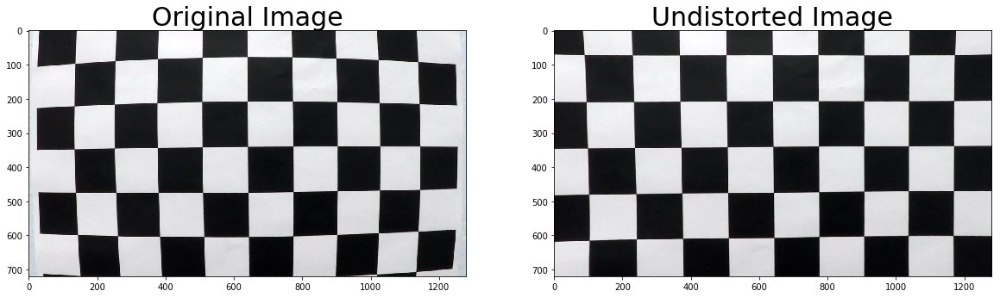

In [23]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
dst = correctCameraDistortion(img)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Test the distortion correction pipeline

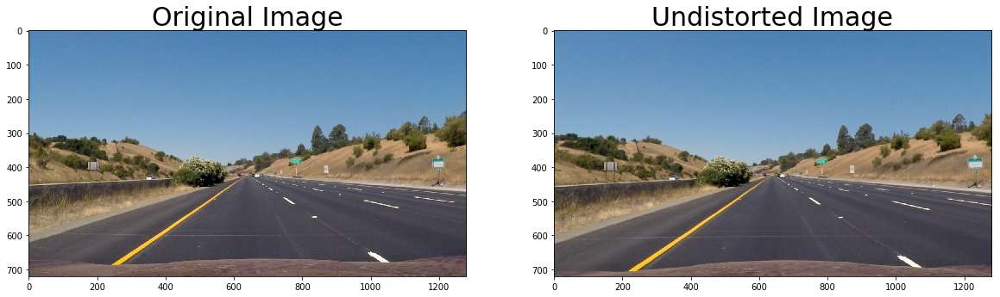

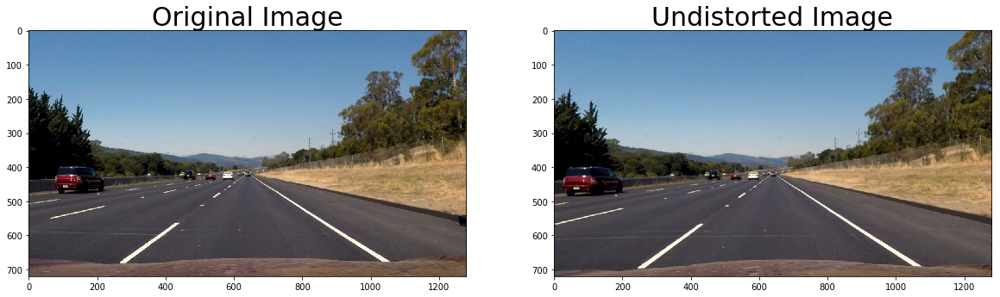

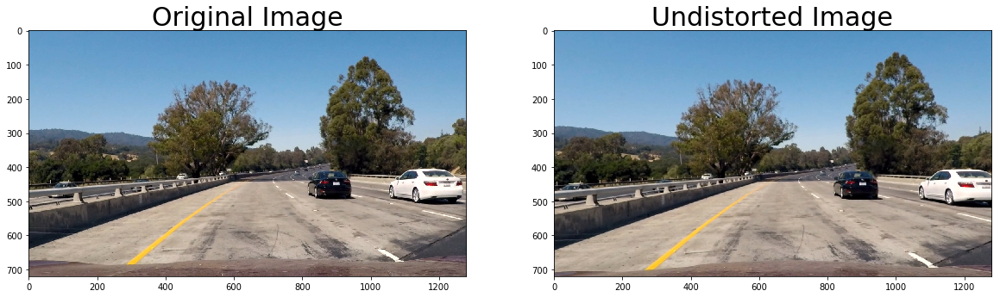

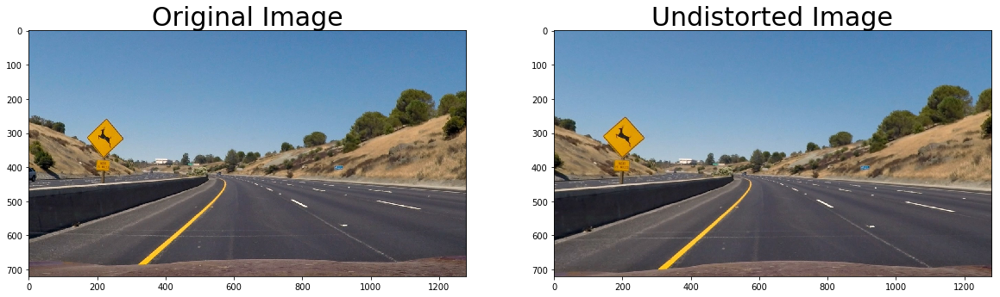

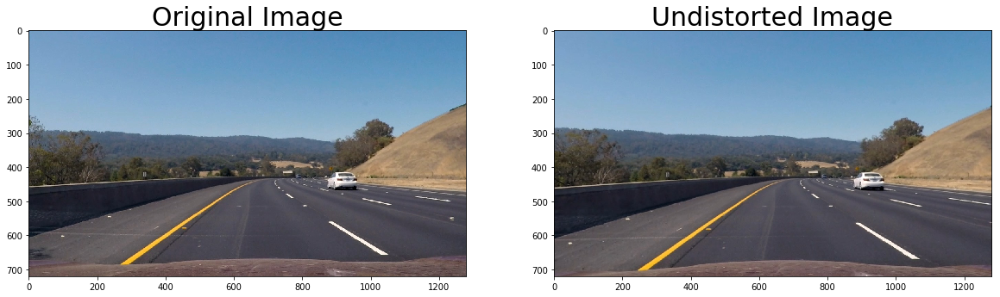

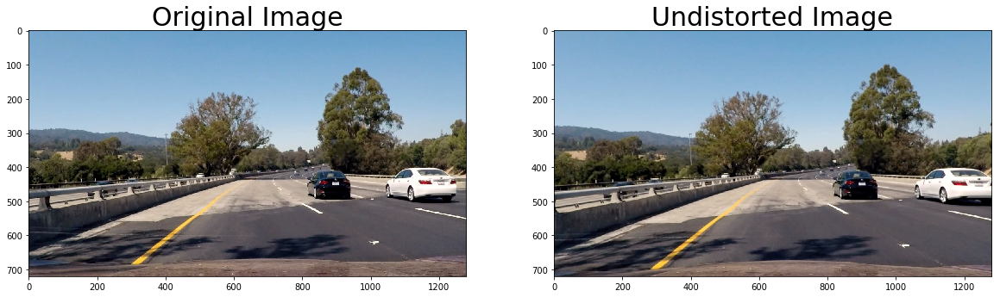

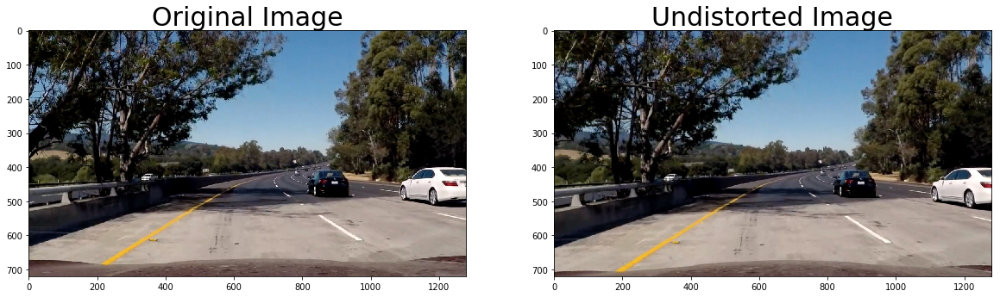

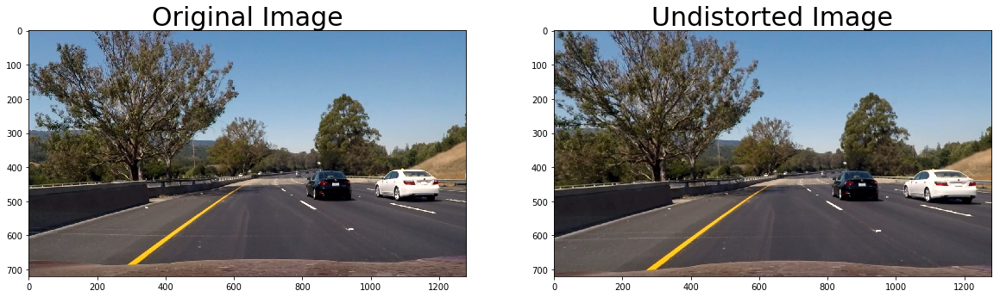

In [24]:
images = glob.glob('test_images/*.jpg')
for name in images:
    image = mpimg.imread(name)
    dst = correctCameraDistortion(image)
    if not os.path.exists('test_images_output'):
        os.makedirs('test_images_output')
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    cv2.imwrite('test_images_output/'+ name.split('/')[1], dst)

## Test color gradient pipeline

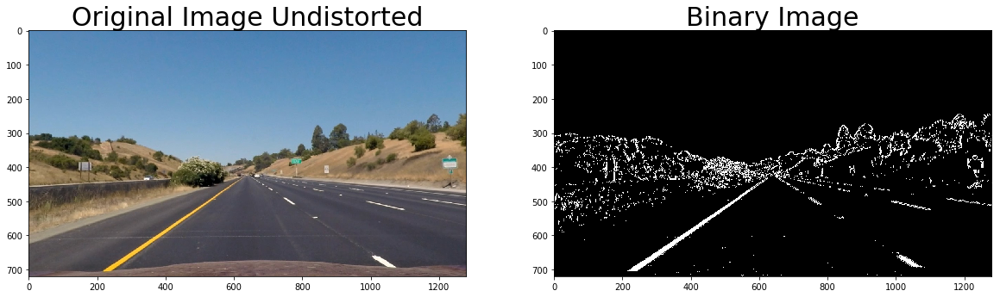

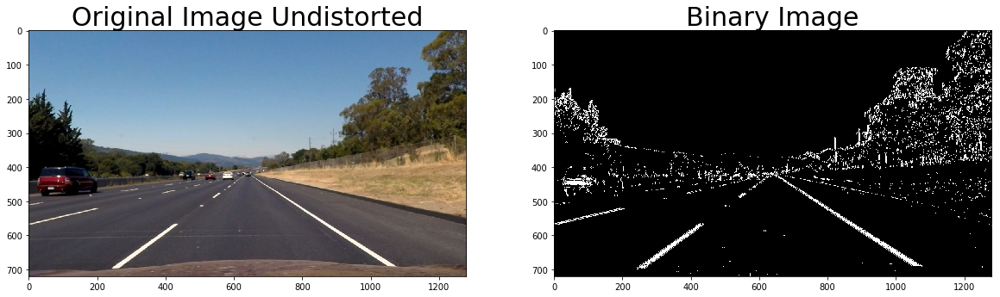

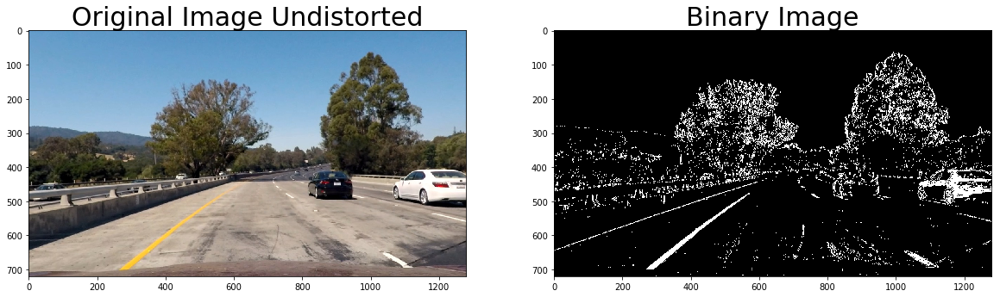

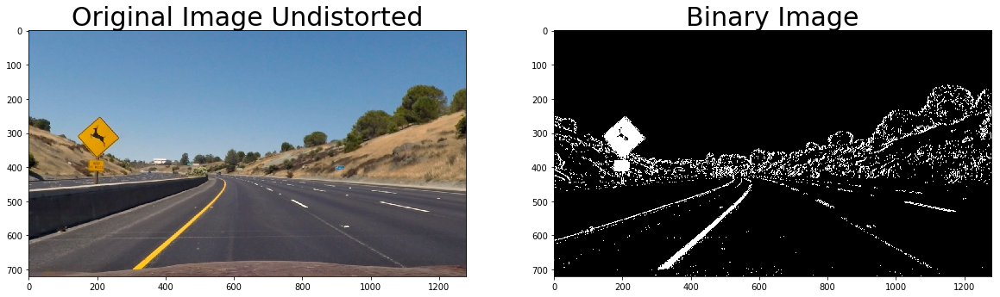

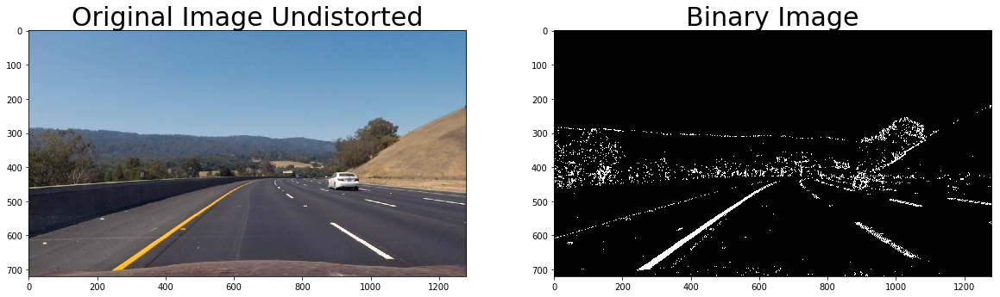

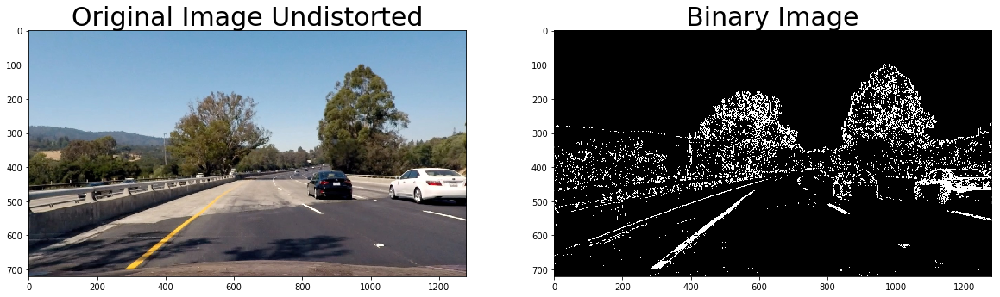

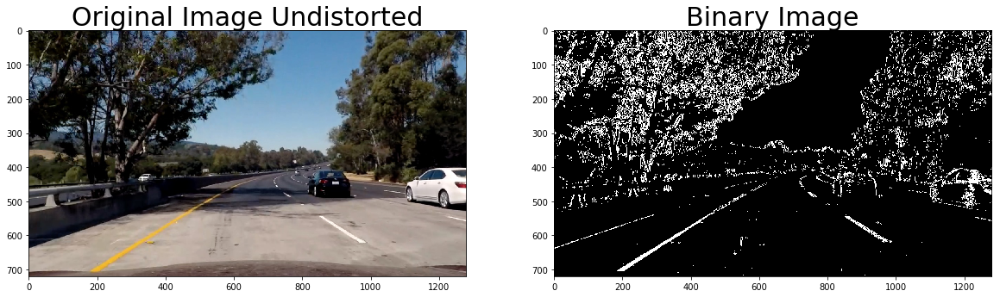

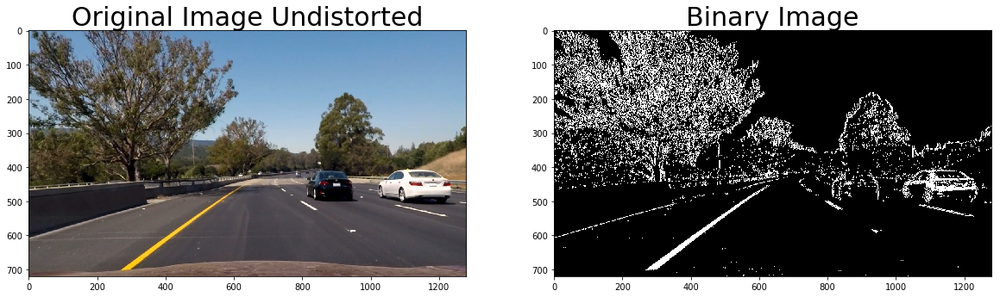

In [25]:
raw_images = glob.glob('test_images/*.jpg')
for image_name in raw_images:
    image = mpimg.imread(image_name)
    dst = correctCameraDistortion(image)
    binary_img = color_gradient_pipeline(dst, sx_thresh = (20, 100),
                                         s_thresh = (170, 255),
                                         l_thresh = (30, 255))
    
    cv2.imwrite('./test_images_output/test_images_binary/'+image_name, binary_img)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(dst)
    ax1.set_title('Original Image Undistorted', fontsize=30)
    ax2.imshow(binary_img, cmap="gray")
    ax2.set_title('Binary Image', fontsize=30)

In [ ]:
def imagePipeline(file_name):
    '''
    Takes an image, object points, and image points
    performs the camera calibration, image distortion correction and
    returns the undistorted image
    '''
#     image = mpimg.imread(image_name)
    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dst = correctCameraDistortion(image)
    binary_img = color_gradient_pipeline(dst)
    return binary_img

## Project the Image into a Birds-eye view

(720, 1280, 3)


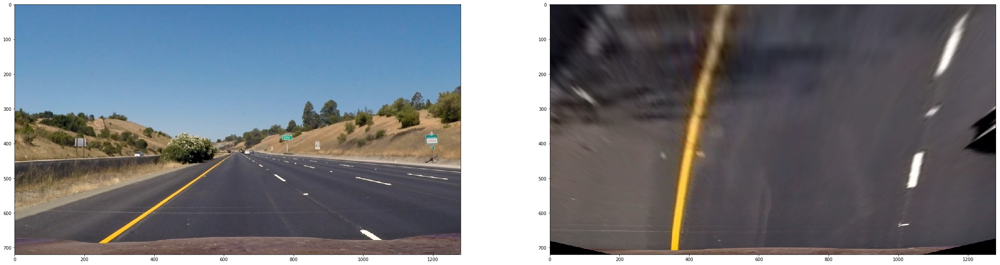

In [26]:
fname = 'test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

src = np.float32([[585, 460], [203, 720], [1127, 720], [695, 460]])
dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
img_size = (image.shape[1], image.shape[0])
binary_warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
print(binary_warped.shape)
f, axes = plt.subplots(1, 2, figsize=(40, 20))
axes[0].imshow(img)
axes[1].imshow(binary_warped)

plt.show()

In [ ]:
for image_name in raw_images:
    file_name='test_images/'+image_name
    image = imagePipeline(file_name)
    warped=projectImageToBird(image)
    # Visualize Warped Image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Binary Image', fontsize=30)
    ax2.imshow(warped)
    ax2.set_title('Warped Image', fontsize=30)

## Detect lane pixels and fit to find the lane boundary

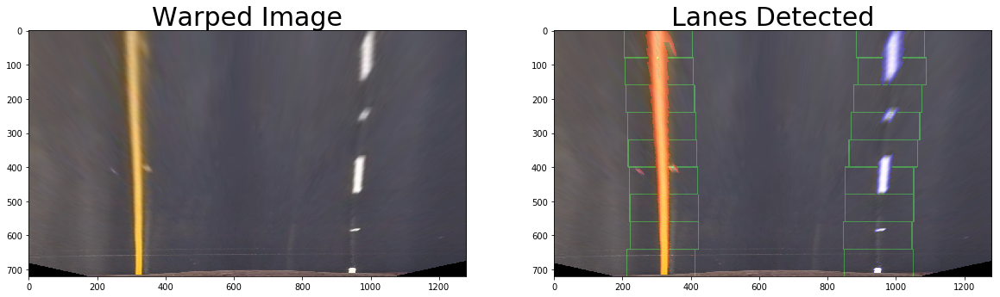

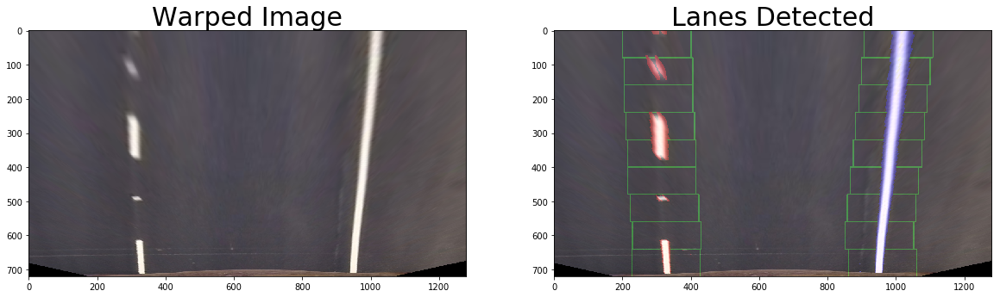

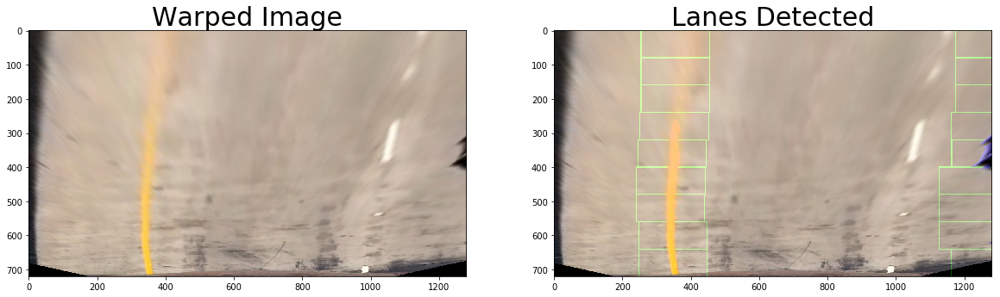

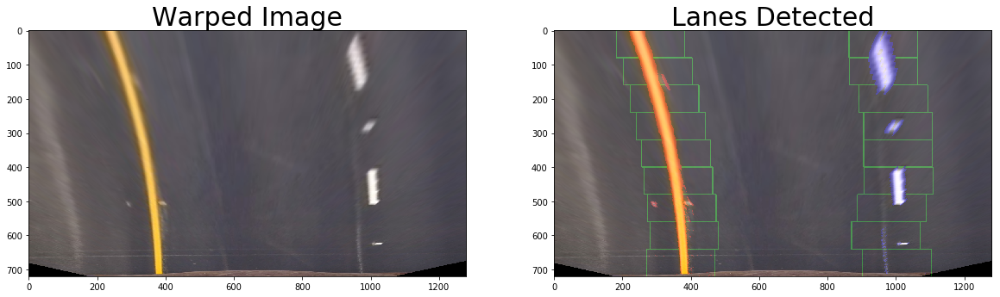

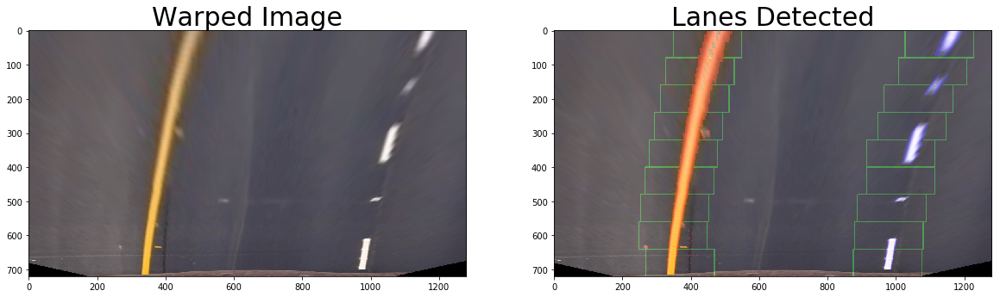

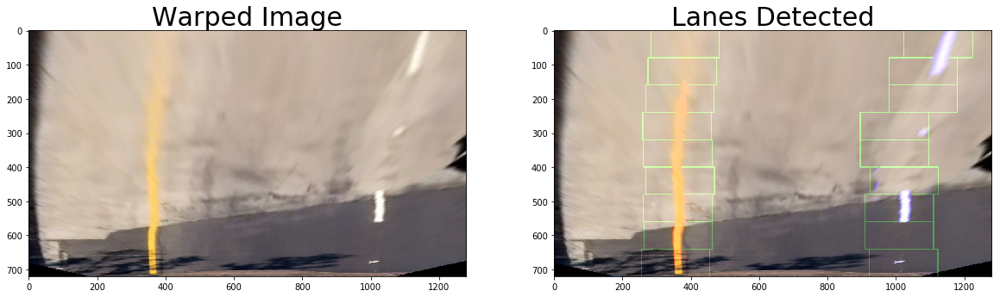

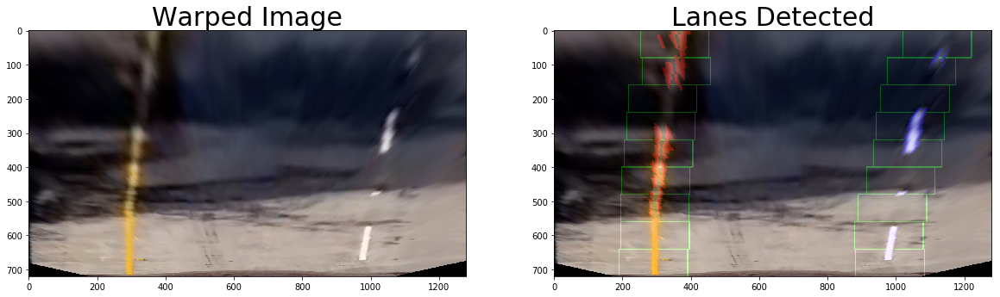

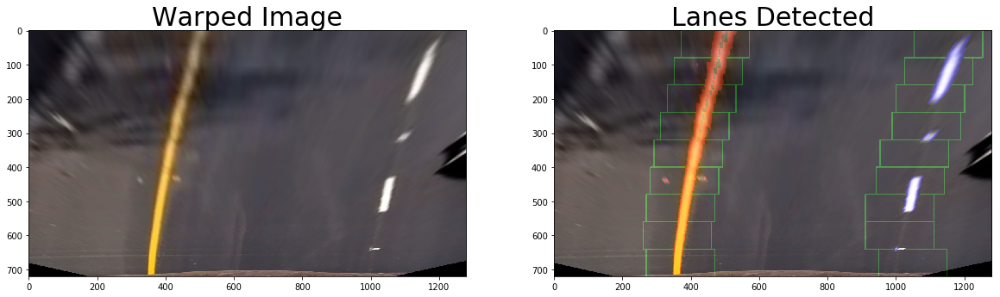

In [12]:
images = glob.glob('test_images/*.jpg')
for name in images:
    image = mpimg.imread(name)
    
    # correct the camera distortion
    orig_img = correctCameraDistortion(image)
    color_warp=projectImageToBird(orig_img)

    # threshold the image and try to pull just the lines out
    img = color_gradient_pipeline(orig_img)
    # switch to birds eye projection
    warped=projectImageToBird(img)
    # fix the image to be 0-255 instead of 0-1
    binary_warped = np.uint8(warped*255)

    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    
    # find the lanes using the historgram method
    leftx,lefty,rightx,righty = findLanesByHistogram(binary_warped)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()

    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)


    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    result = cv2.addWeighted(color_warp, 1, out_img, 0.3, 0)


    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(color_warp)
    ax1.set_title('Warped Image', fontsize=30)
    ax2.imshow(result)
    ax2.set_title('Lanes Detected', fontsize=30)

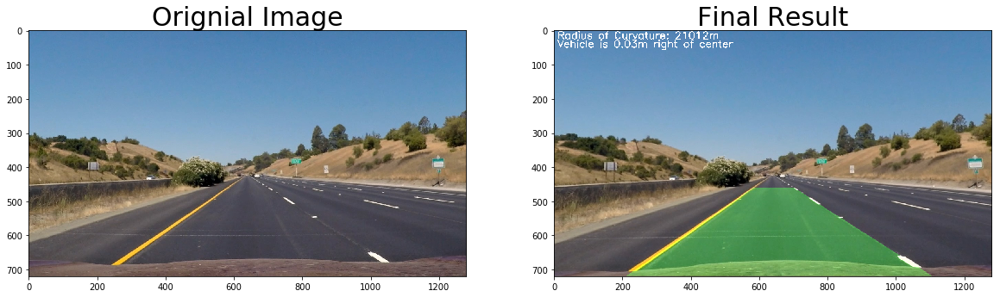

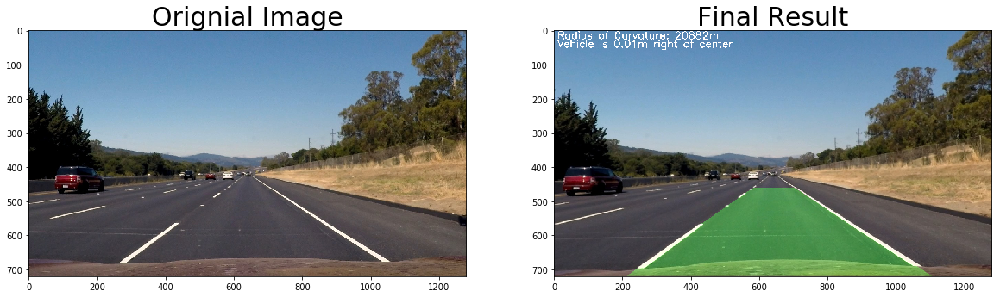

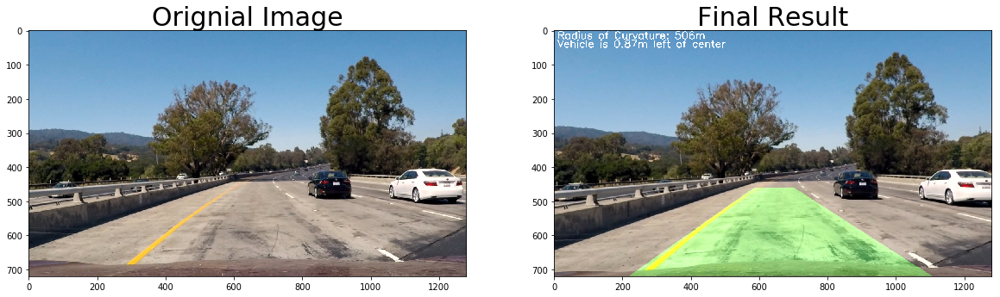

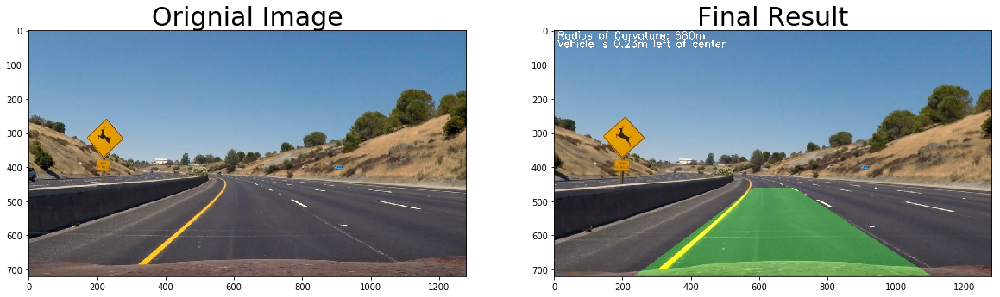

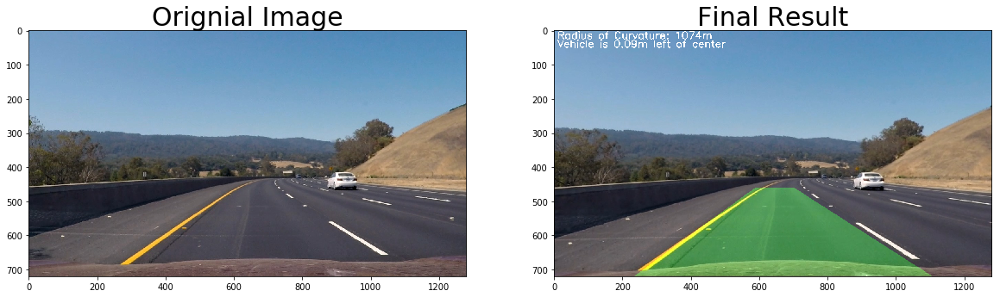

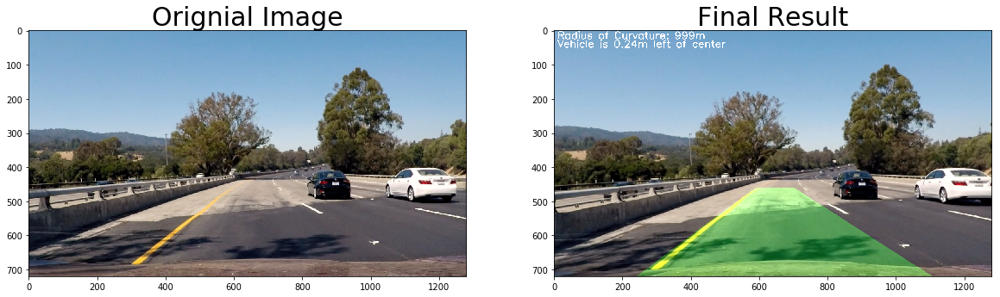

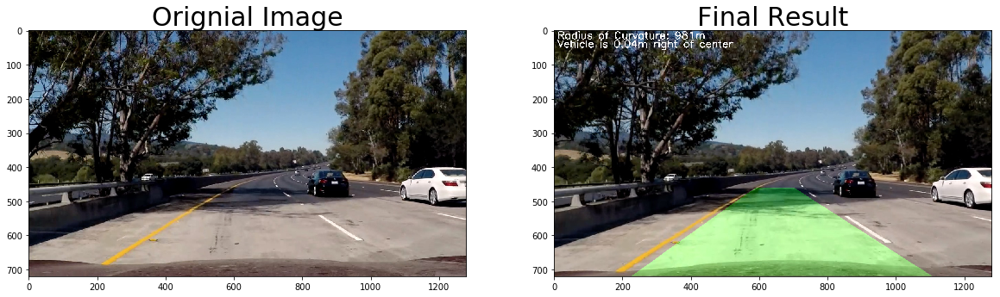

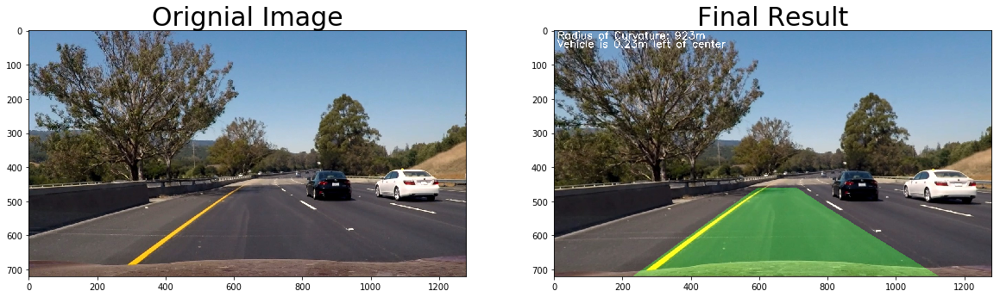

In [54]:
raw_images = glob.glob('test_images/*.jpg')
for image_name in raw_images:
    image = mpimg.imread(image_name)
    res = lanePipeline(image)
    # Visualize Warped Image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Orignial Image', fontsize=30)
    ax2.imshow(res)
    ax2.set_title('Final Result', fontsize=30)

In [66]:
clip1 = VideoFileClip("project_video.mp4")
out_clip = clip1.fl_image(lanePipeline)
out_clip.write_videofile('project_video_out.mp4',audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [02:25<00:00,  8.49it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



In [67]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_out.mp4'))